In [ ]:
import sympy as sp
import matplotlib.pyplot as plt
import numpy as np
from IPython.display import display, Math, Latex

sigdig = 6

# Define the variables
K, L, M = sp.symbols('K L M')
u = sp.tanh(K)

# Define the functions
z_0 = sp.exp(3*K) + 3*sp.exp(-K)
f_1 = (sp.exp(3*K) + sp.exp(-K))/z_0
f_2 = (sp.exp(3*K) - sp.exp(-K))/z_0
a = 1 - f_1**2
b = f_2 - f_1**2

# Define K prime
K_prime = sp.atanh(2*u*f_1**2/(1+u**2*f_2))

Intersection point: (K, K') = (0.36529706718792676, 0.36529706718792737)
Derivative of K' at the intersection point: 1.7972908176346394


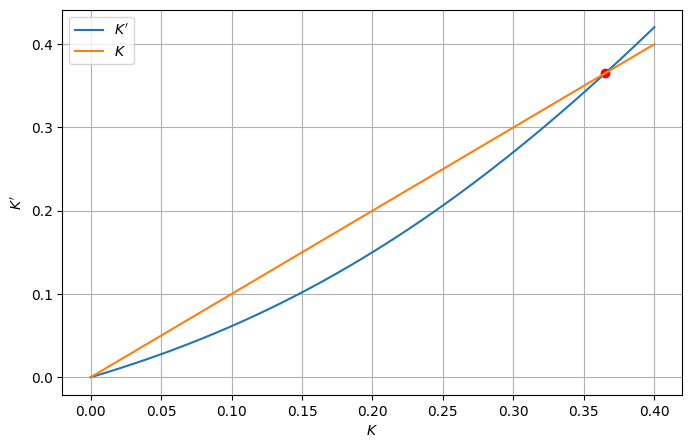

In [ ]:
from scipy.optimize import fsolve
import sympy as sp
import matplotlib.pyplot as plt
import numpy as np

sigdig = 6

# Define the variables
K, L, M = sp.symbols('K L M')
u = sp.tanh(K)

# Define the functions
z_0 = sp.exp(3*K) + 3*sp.exp(-K)
f_1 = (sp.exp(3*K) + sp.exp(-K))/z_0
f_2 = (sp.exp(3*K) - sp.exp(-K))/z_0
a = 1 - f_1**2
b = f_2 - f_1**2

# Define K prime
K_prime = sp.atanh(2*u*f_1**2/(1+u**2*f_2))
K_values = np.linspace(0, 0.4, 100)
K_prime_func = sp.lambdify(K, K_prime, "numpy")
K_prime_values = K_prime_func(K_values)

# Define the difference function to find the intersection point
def diff_func(K_values):
    return K_prime_func(K_values) - K_values

# Solve for the intersection
K_intersection = fsolve(diff_func, 0.4)  # You may need to adjust the initial guess if necessary

# Compute K' at the intersection point
K_prime_intersection = K_prime_func(K_intersection)
K_prime_values = K_prime_func(K_values)
K_prime_values = K_prime_func(K_values)


print("Intersection point: (K, K') = ({}, {})".format(K_intersection[0], K_prime_intersection[0]))
# Compute the derivative of K'
K_prime_taylor = sp.series(K_prime, K, 0, 5).removeO()
K_prime_derivative = sp.diff(K_prime_taylor, K)

# Create a lambdified function for the derivative
K_prime_derivative_func = sp.lambdify(K, K_prime_derivative, "numpy")

# Evaluate the derivative at the intersection point
K_prime_derivative_at_intersection = K_prime_derivative_func(K_intersection)

print("Derivative of K' at the intersection point: {}".format(K_prime_derivative_at_intersection[0]))

# Plot K' as a function of K
plt.figure(figsize=(8, 5))
plt.plot(K_values, K_prime_values, label="$K'$")
plt.plot(K_values, K_values, label="$K$")
plt.scatter(K_intersection, K_prime_intersection, color='red')  # Plot the intersection point
plt.xlabel('$K$')
plt.ylabel("$K'$")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
K_prime_derivative_at_intersection[0] / np.sqrt(3)  - 1

0.03766633737340164

In [ ]:
K_intersection[0] / (np.log(3) /4) - 1

0.3300308797047611

In [ ]:
import sympy as sp

# Define the variables
K, L, M = sp.symbols('K L M')
u = sp.tanh(K)

# Define the functions
z_0 = sp.exp(3*K) + 3*sp.exp(-K)
f_1 = (sp.exp(3*K) + sp.exp(-K))/z_0
f_2 = (sp.exp(3*K) - sp.exp(-K))/z_0
a = 1 - f_1**2
b = f_2 - f_1**2

K_prime = 2*f_1**2*K + 4*(a + b)*f_1**2*K**2 + 3*f_1**2*L + 2*f_1**2*M
L_prime = (a + 7*b)*f_1**2*K**2 + f_1**2*M
M_prime = 4*b*f_1**2*K**2

In [ ]:
from scipy.optimize import fsolve

# Define the difference functions to find the fixed points
def diff_func(variables):
    K_val, L_val, M_val = variables
    return [K_prime.subs({K: K_val, L: L_val, M: M_val}) - K_val,
            L_prime.subs({K: K_val, L: L_val, M: M_val}) - L_val,
            M_prime.subs({K: K_val, L: L_val, M: M_val}) - M_val]

# Initial guesses for K, L, and M
initial_guesses = [0.2789, -0.0143, -0.0152]

# Solve for the fixed points
K_star, L_star, M_star = fsolve(diff_func, initial_guesses)

print("Fixed points: (K*, L*, M*) = ({:.6g}, {:.6g}, {:.6g})".format(K_star, L_star, M_star))


Fixed points: (K*, L*, M*) = (0.278869, -0.014248, -0.0152312)


In [ ]:
# Calculate the Jacobian matrix
J = sp.Matrix([K_prime, L_prime, M_prime]).jacobian([K, L, M])

# Evaluate the Jacobian at the fixed point
J_star = J.subs({K: K_star, L: L_star, M: M_star})

# Print the Jacobian
print("Jacobian matrix at the fixed point:")
print(sp.latex(J_star.evalf(n=sigdig)))
display(Math(sp.latex(J_star.evalf(n=sigdig))))

Jacobian matrix at the fixed point:
\left[\begin{matrix}1.83127 & 1.3446 & 0.8964\\-0.00519238 & 0 & 0.4482\\-0.0781295 & 0 & 0\end{matrix}\right]


<IPython.core.display.Math object>

In [ ]:
# Compute the eigenvalues and eigenvectors of the Jacobian
eigenvalues_and_eigenvectors = J_star.eigenvals(multiple=True)

# Print the eigenvalues and eigenvectors
print("Eigenvalues and eigenvectors of the Jacobian matrix at the fixed point:")

# Print Eigenvalues
print("Eigenvalues:")
for idx, eigenvalue in enumerate(eigenvalues_and_eigenvectors):
    print(f"Eigenvalue {idx+1}: {sp.N(eigenvalue, 6)}")

# Print Eigenvectors
eigenvectors = J_star.eigenvects()
print("\nEigenvectors:")
for idx, (_, _, eigenvector) in enumerate(eigenvectors):
    print(f"Eigenvector {idx+1}: {sp.N(eigenvector[0], 6)}")


Eigenvalues and eigenvectors of the Jacobian matrix at the fixed point:
Eigenvalues:
Eigenvalue 1: 1.77284 - 3.22657e-66*I
Eigenvalue 2: -0.136354 + 1.05215e-66*I
Eigenvalue 3: 0.194778 + 2.0867e-66*I

Eigenvectors:
Eigenvector 1: Matrix([[0.998811 - 0.0155036*I], [-0.0140537 + 0.000218141*I], [-0.0440178 + 0.000683245*I]])
Eigenvector 2: Matrix([[-0.510251 - 0.0861986*I], [0.941589 + 0.159066*I], [-0.292368 - 0.0493908*I]])
Eigenvector 3: Matrix([[0.959762 - 0.146854*I], [-0.911456 + 0.139462*I], [-0.38498 + 0.058906*I]])


In [ ]:
# Compute the eigenvalues and eigenvectors of the Jacobian
eigenvectors = J_star.eigenvects()

# Print the eigenvalues and eigenvectors
print("Eigenvalues and Eigenvectors of the Jacobian matrix at the fixed point:")

# Print Eigenvalues
print("Eigenvalues:")
for idx, (eigenvalue, _, _) in enumerate(eigenvectors):
    eigenvalue = sp.N(eigenvalue, 6)
    if eigenvalue.is_real:
        print(f"Eigenvalue {idx+1}: {eigenvalue}")
    else:
        print(f"Eigenvalue {idx+1}: {eigenvalue.as_real_imag()[0]}")  # print real part

# Print Eigenvectors
print("\nEigenvectors:")
for idx, (_, _, eigenvector) in enumerate(eigenvectors):
    eigenvector = sp.N(eigenvector[0], 6)
    if eigenvector.is_real:
        print(f"Eigenvector {idx+1}: {eigenvector}")
    else:
        # print real part
        print(f"Eigenvector {idx+1}: {list(map(lambda i: i.as_real_imag()[0], eigenvector))}")


Eigenvalues and Eigenvectors of the Jacobian matrix at the fixed point:
Eigenvalues:
Eigenvalue 1: 1.77284
Eigenvalue 2: -0.136354
Eigenvalue 3: 0.194778

Eigenvectors:
Eigenvector 1: [0.998811, -0.0140537, -0.0440178]
Eigenvector 2: [-0.510251, 0.941589, -0.292368]
Eigenvector 3: [0.959762, -0.911456, -0.384980]


In [ ]:
np.sqrt(3)

1.7320508075688772

In [ ]:
# Define the target eigenvalue
target_eigenvalue = 1.77284

# Calculate the difference between the target eigenvalue and each of the eigenvalues
diffs = [abs(eigenvalue.evalf() - target_eigenvalue) for eigenvalue, _, _ in eigenvectors]

# Get the index of the minimum difference
index = diffs.index(min(diffs))

# Get the eigenvector corresponding to this index
eigenvalue, _, eigenvector = eigenvectors[index]
normalized_eigenvector = [val.evalf() for val in (eigenvector[0] / eigenvector[0][0])]

# Print the eigenvector
print(f"Eigenvector corresponding to the eigenvalue closest to {target_eigenvalue}: {eigenvalue}, {normalized_eigenvector}")


Eigenvector corresponding to the eigenvalue closest to 1.77284: 1.7728434057436 - 3.22657467850227e-66*I, [1.00000000000000, -0.0140704019131738, -0.0440701687776666]


In [ ]:
# Normalize the eigenvector by its first value
normalized_eigenvector = [val.evalf() for val in (eigenvector[0] / eigenvector[0][0])]

# Print the normalized eigenvector
print(f"Normalized eigenvector corresponding to the eigenvalue closest to {target_eigenvalue}: {normalized_eigenvector}")


Normalized eigenvector corresponding to the eigenvalue closest to 1.77284: [1.00000000000000, -0.0140704019131738, -0.0440701687776666]


In [ ]:
1.773  / np.sqrt(3)-1

0.023642027273206523

In [ ]:
K_star * normalized_eigenvector[0] + L_star * normalized_eigenvector[1] + M_star * normalized_eigenvector[2]

0.279740772632524

In [ ]:
0.2797 / (np.log(3)/4)-1

0.0183756467501055

In [ ]:
np.log(3)/4

0.27465307216702745

In [ ]:
np.sqrt(3)

1.7320508075688772

## Cluster approximation order 2

Intersection point: (K, K') = (0.36529706718792676, 0.36529706718792737)
Derivative of K' at the intersection point: 1.7972908176346394


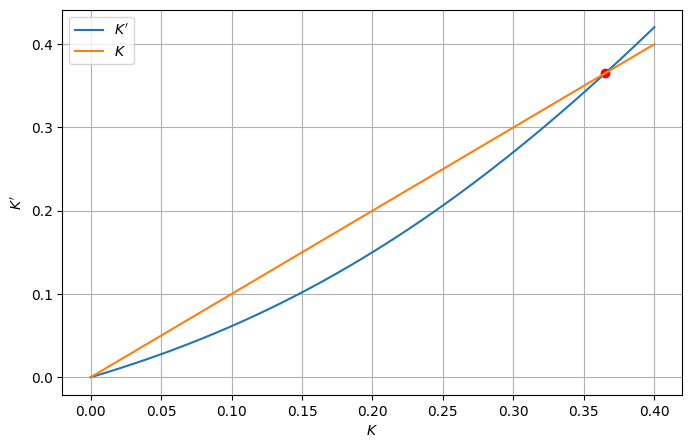

In [ ]:
from scipy.optimize import fsolve
import sympy as sp
import matplotlib.pyplot as plt
import numpy as np

sigdig = 6

# Define the variables
K, L, M = sp.symbols('K L M')
u = sp.tanh(K)

# Define the functions
z_0 = sp.exp(3*K) + 3*sp.exp(-K)
f_1 = (sp.exp(3*K) + sp.exp(-K))/z_0
f_2 = (sp.exp(3*K) - sp.exp(-K))/z_0
a = 1 - f_1**2
b = f_2 - f_1**2

# Define K prime
K_prime = sp.atanh(2*u*f_1**2/(1+u**2*f_2))
K_values = np.linspace(0, 0.4, 100)
K_prime_func = sp.lambdify(K, K_prime, "numpy")
K_prime_values = K_prime_func(K_values)

# Define the difference function to find the intersection point
def diff_func(K_values):
    return K_prime_func(K_values) - K_values

# Solve for the intersection
K_intersection = fsolve(diff_func, 0.4)  # You may need to adjust the initial guess if necessary

# Compute K' at the intersection point
K_prime_intersection = K_prime_func(K_intersection)
K_prime_values = K_prime_func(K_values)
K_prime_values = K_prime_func(K_values)


print("Intersection point: (K, K') = ({}, {})".format(K_intersection[0], K_prime_intersection[0]))
# Compute the derivative of K'
K_prime_taylor = sp.series(K_prime, K, 0, 5).removeO()
K_prime_derivative = sp.diff(K_prime_taylor, K)

# Create a lambdified function for the derivative
K_prime_derivative_func = sp.lambdify(K, K_prime_derivative, "numpy")

# Evaluate the derivative at the intersection point
K_prime_derivative_at_intersection = K_prime_derivative_func(K_intersection)

print("Derivative of K' at the intersection point: {}".format(K_prime_derivative_at_intersection[0]))

# Plot K' as a function of K
plt.figure(figsize=(8, 5))
plt.plot(K_values, K_prime_values, label="$K'$")
plt.plot(K_values, K_values, label="$K$")
plt.scatter(K_intersection, K_prime_intersection, color='red')  # Plot the intersection point
plt.xlabel('$K$')
plt.ylabel("$K'$")
plt.legend()
plt.grid(True)
plt.show()


## Cluster of order 3

In [ ]:
from scipy.optimize import fsolve
import sympy as sp
import matplotlib.pyplot as plt
import numpy as np

sigdig = 6

# Define the variables
K, L, M = sp.symbols('K L M')
u = sp.tanh(K)

# Define the functions
z_0 = sp.exp(3*K) + 3*sp.exp(-K)
f1 = (sp.exp(3*K) + sp.exp(-K))/z_0
f2 = (sp.exp(3*K) - sp.exp(-K))/z_0
a = 1 - f1**2
b = f2 - f1**2

K22_prime = sp.atanh(2*u*f1**2/(1+u**2*f2))
# K32_prime = sp.atanh((2*u*(u+1)*(u**2+1)*(u*f2+1)*f1**2) / ((u**2*f2+1)**3 + u**3 * (f2+1)**3))
K32_prime = sp.atanh((2*u*f1**2*(u**2+1)) / ((u**2*f2+1)**2 + (u*f2+u)**2 - (u**2*f2+1)*(u*f2+u)))
K_prime = 2* K32_prime - K22_prime

Intersection point: (K, K') = (0.16523129680761847, 0.16523129680761822)
Derivative of K' at the intersection point: 1.6797302493241353


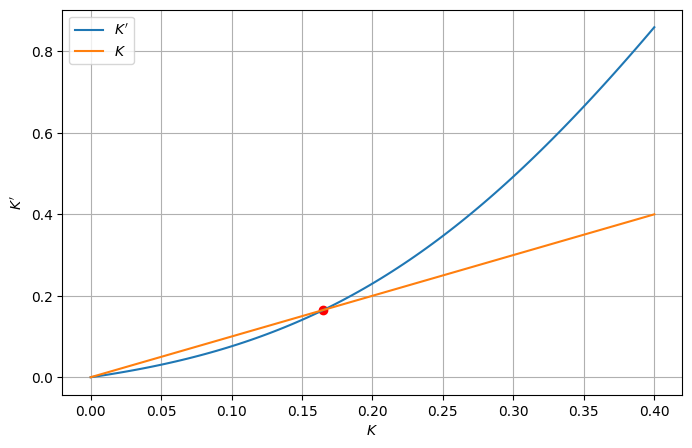

In [ ]:
# Define K prime
K_values = np.linspace(0, 0.4, 100)
K_prime_func = sp.lambdify(K, K_prime, "numpy")
K_prime_values = K_prime_func(K_values)

# Define the difference function to find the intersection point
def diff_func(K_values):
    return K_prime_func(K_values) - K_values

# Solve for the intersection
K_intersection = fsolve(diff_func, 0.4)  # You may need to adjust the initial guess if necessary

# Compute K' at the intersection point
K_prime_intersection = K_prime_func(K_intersection)
K_prime_values = K_prime_func(K_values)

print("Intersection point: (K, K') = ({}, {})".format(K_intersection[0], K_prime_intersection[0]))
# Compute the derivative of K'
K_prime_derivative = sp.diff(K_prime, K)

# Create a lambdified function for the derivative
K_prime_derivative_func = sp.lambdify(K, K_prime_derivative, "numpy")

# Evaluate the derivative at the intersection point
K_prime_derivative_at_intersection = K_prime_derivative_func(K_intersection)

print("Derivative of K' at the intersection point: {}".format(K_prime_derivative_at_intersection[0]))

# Plot K' as a function of K
plt.figure(figsize=(8, 5))
plt.plot(K_values, K_prime_values, label="$K'$")
plt.plot(K_values, K_values, label="$K$")
plt.scatter(K_intersection, K_prime_intersection, color='red')  # Plot the intersection point
plt.xlabel('$K$')
plt.ylabel("$K'$")
plt.legend()
plt.grid(True)
plt.show()


In [ ]:
K_intersection[0]*2

0.33046259361523694

## Migdal's renormalization trick for the 2D Ising problem

See Kadanoff 2000, Chapter 14.4.

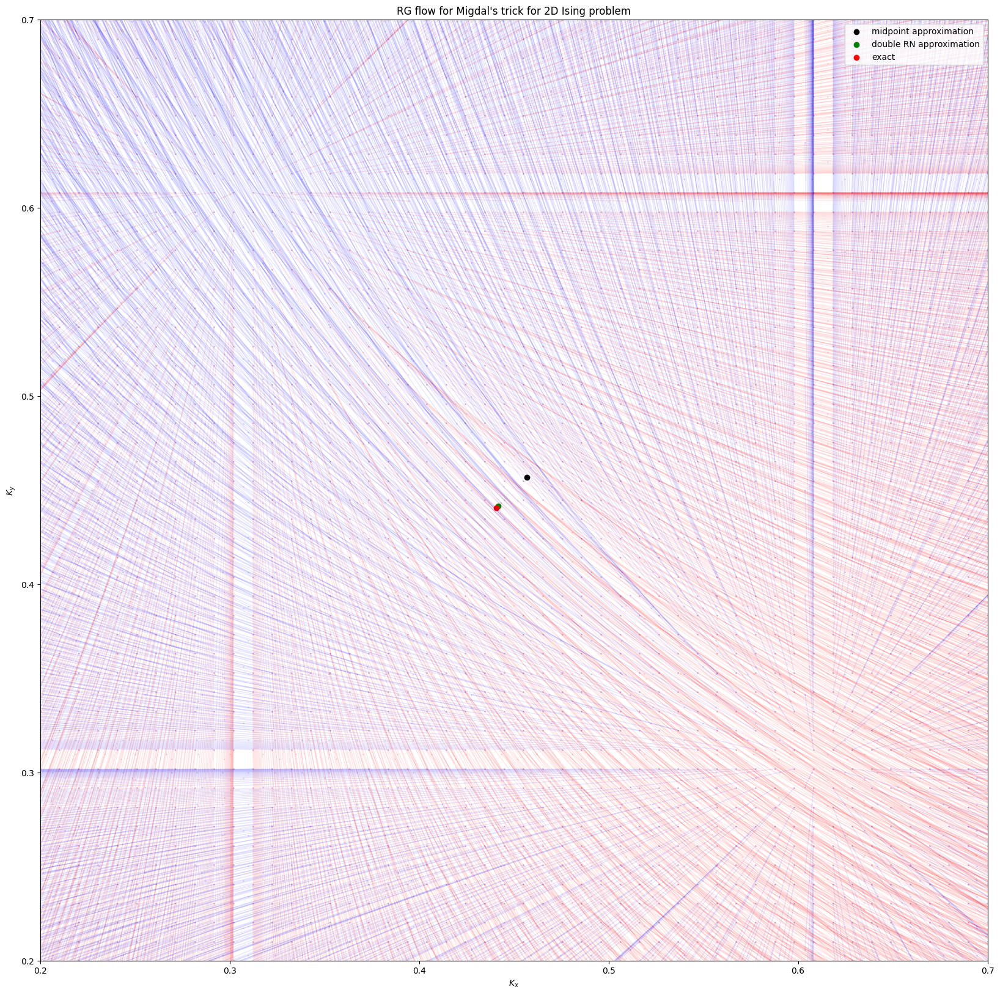

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def f1(x):
    return np.log(np.cosh(4*x))/2
def f2(x):
    return np.log(np.cosh(2*x))

# Define the functions f and g
def f(x, y):
    return (f2(x), f1(y))

def g(x, y):
    return (f1(x), f2(y))

# Define the grid size
N = 50

# Generate the grid of initial points
min_k, max_k = 0.2, 0.7
x_vals = np.linspace(min_k, max_k, N)
y_vals = np.linspace(min_k, max_k, N)
grid = [(x, y) for x in x_vals for y in y_vals]

# Define the number of iterations for each point
iterations = 3

# Create a new plot
plt.figure(figsize=(20, 20))

# Iterate over each initial point
for x0, y0 in grid:
    # Initialize the current points for f and g flows
    x_f, y_f, x_g, y_g = x0, y0, x0, y0

    # Prepare containers for x and y coordinates of the sequences
    x_seq_f, y_seq_f, x_seq_g, y_seq_g = [x_f], [y_f], [x_g], [y_g]

    # Generate the sequences of points for the current initial point
    for _ in range(iterations):
        # Apply the functions f and g
        x_f, y_f = f(x_f, y_f)
        x_g, y_g = g(x_g, y_g)

        # Add the current points to the sequences
        x_seq_f.append(x_f)
        y_seq_f.append(y_f)
        x_seq_g.append(x_g)
        y_seq_g.append(y_g)

    # Plot the sequences of points as lines
    plt.plot(x_seq_f, y_seq_f, 'b', marker='o', markersize=1, linewidth=1, alpha=0.1)
    plt.plot(x_seq_g, y_seq_g, 'r', marker='o', markersize=1, linewidth=1, alpha=0.1)

## ----

import numpy as np
from scipy.optimize import fsolve

plt.title("RG flow for Migdal's trick for 2D Ising problem")
plt.xlabel(r'$K_x$')
plt.ylabel(r'$K_y$')

x0 = 0.4
k_c = np.log(1+np.sqrt(2))/2
k_c_midpoint = (fsolve(lambda x: f2(x)-x, x0)[0] + fsolve(lambda x: f1(x)-x, x0)[0])/2
k_c_both = (fsolve(lambda x: f1(f2(x))-x, x0)[0] + fsolve(lambda x: f2(f1(x))-x, x0)[0])/2

plt.scatter(k_c_midpoint, k_c_midpoint, color='black', label="midpoint approximation")
plt.scatter(k_c_both, k_c_both, color='green', label="double RN approximation")
plt.scatter(k_c, k_c, color='red', label="exact")
plt.legend(loc="upper right")

plt.xlim(min_k, max_k)
plt.ylim(min_k, max_k)

# Display the plot
plt.show()

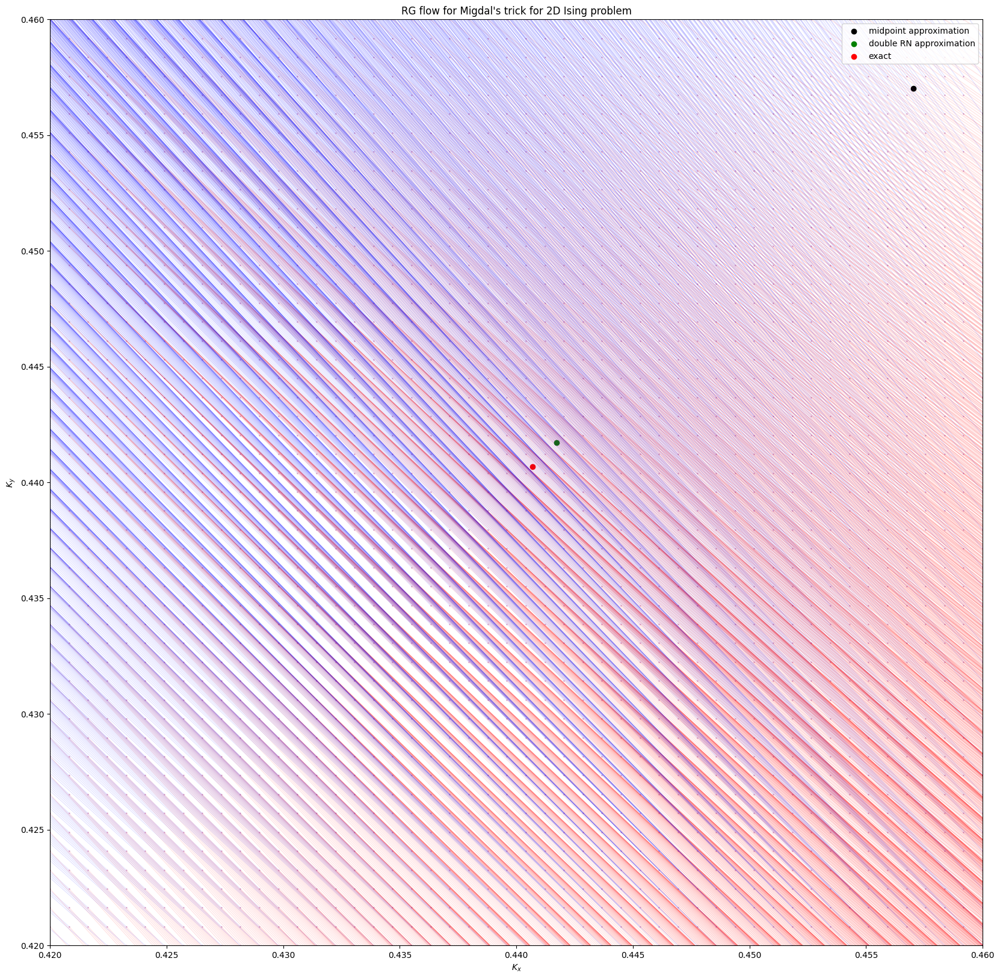

In [ ]:
import matplotlib.pyplot as plt
import numpy as np

def f1(x):
    return np.log(np.cosh(4*x))/2
def f2(x):
    return np.log(np.cosh(2*x))

# Define the functions f and g
def f(x, y):
    return (f2(x), f1(y))

def g(x, y):
    return (f1(x), f2(y))

# Define the grid size
N = 50

# Generate the grid of initial points
min_k, max_k = 0.42, 0.46
x_vals = np.linspace(min_k, max_k, N)
y_vals = np.linspace(min_k, max_k, N)
grid = [(x, y) for x in x_vals for y in y_vals]

# Define the number of iterations for each point
iterations = 3

# Create a new plot
plt.figure(figsize=(20, 20))

# Iterate over each initial point
for x0, y0 in grid:
    # Initialize the current points for f and g flows
    x_f, y_f, x_g, y_g = x0, y0, x0, y0

    # Prepare containers for x and y coordinates of the sequences
    x_seq_f, y_seq_f, x_seq_g, y_seq_g = [x_f], [y_f], [x_g], [y_g]

    # Generate the sequences of points for the current initial point
    for _ in range(iterations):
        # Apply the functions f and g
        x_f, y_f = f(x_f, y_f)
        x_g, y_g = g(x_g, y_g)

        # Add the current points to the sequences
        x_seq_f.append(x_f)
        y_seq_f.append(y_f)
        x_seq_g.append(x_g)
        y_seq_g.append(y_g)

    # Plot the sequences of points as lines
    plt.plot(x_seq_f, y_seq_f, 'b', marker='o', markersize=1, linewidth=1, alpha=0.1)
    plt.plot(x_seq_g, y_seq_g, 'r', marker='o', markersize=1, linewidth=1, alpha=0.1)

## ----

import numpy as np
from scipy.optimize import fsolve

plt.title("RG flow for Migdal's trick for 2D Ising problem")
plt.xlabel(r'$K_x$')
plt.ylabel(r'$K_y$')

x0 = 0.4
k_c = np.log(1+np.sqrt(2))/2
k_c_midpoint = (fsolve(lambda x: f2(x)-x, x0)[0] + fsolve(lambda x: f1(x)-x, x0)[0])/2
k_c_both = (fsolve(lambda x: f1(f2(x))-x, x0)[0] + fsolve(lambda x: f2(f1(x))-x, x0)[0])/2

plt.scatter(k_c_midpoint, k_c_midpoint, color='black', label="midpoint approximation")
plt.scatter(k_c_both, k_c_both, color='green', label="double RN approximation")
plt.scatter(k_c, k_c, color='red', label="exact")
plt.legend(loc="upper right")

plt.xlim(min_k, max_k)
plt.ylim(min_k, max_k)

# Display the plot
plt.show()

In [ ]:
eps = 1e-5
((f1(f2(k_c_both+eps)) - f1(f2(k_c_both-eps)))/(2*eps) + (f2(f1(k_c_both+eps)) - f2(f1(k_c_both-eps)))/(2*eps))/2

2.7633323060841093

In [ ]:
np.log(4)/np.log(2.7633323060841093)

1.3638759116816561